In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
from keras.applications import vgg16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from nltk.translate.bleu_score import sentence_bleu
from numpy import array
import pickle
import numpy as np
import os
import cv2
import json

In [73]:
%%capture
res_model=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))

In [74]:
train_path='/home/kabilan/Desktop/caption/sample/image_caption_test_dict.json'

In [75]:
train_captions = json.load(open(train_path,'r'))

In [76]:
path = "/home/kabilan/Desktop/caption/dataset/images/"
bg_path = "/home/kabilan/Desktop/caption/pdataset/objects/"

In [77]:
for each in train_captions.keys():
    captions = train_captions[each]
    for i in range(len(captions)):
        captions[i] =  "<start> " + f"{captions[i]}".strip() + " <end>"

In [78]:
train_features={}
c=0
for image_name in tqdm(train_captions):
  img_path=path+image_name
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = res_model.predict(x)
  train_features[image_name]=features.squeeze()

100%|███████████████████████████████████████| 1000/1000 [00:51<00:00, 19.60it/s]


In [79]:
train_features_background={}
c=0
for image_name in tqdm(train_captions):
  img_path=bg_path+image_name
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = res_model.predict(x)
  train_features_background[image_name]=features.squeeze()

100%|███████████████████████████████████████| 1000/1000 [00:50<00:00, 19.62it/s]


In [80]:
all_captions=[]
for img_id in train_captions:
  for captions in train_captions[img_id]:
    all_captions.append(captions)
all_words=" ".join(all_captions)
print(len(all_words))
unique_words=list(set(all_words.strip().split(" ")))
print(len(unique_words))

332863
2648


In [81]:
vocab_size=len(unique_words)+1
max_length=40

In [82]:
words_to_indices={val:index+1 for index, val in enumerate(unique_words)}
indices_to_words = { index+1:val for index, val in enumerate(unique_words)}
words_to_indices["Unk"]=0
indices_to_words[0]="Unk"

In [83]:
train_encoded_captions={}
for img_id in tqdm(train_captions):
  train_encoded_captions[img_id]=[]
  for i in range(5):
    train_encoded_captions[img_id].append([words_to_indices[s] for s in train_captions[img_id][i].split(" ")])

100%|████████████████████████████████████| 1000/1000 [00:00<00:00, 60945.12it/s]


In [84]:
for img_id in tqdm(train_encoded_captions):
  train_encoded_captions[img_id]=pad_sequences(train_encoded_captions[img_id], maxlen=max_length, padding='post')

100%|████████████████████████████████████| 1000/1000 [00:00<00:00, 36416.16it/s]


In [85]:
def data_generator(train_encoded_captions,train_features,train_features_background,num_of_photos):
  X1, X2, Y , X3 = list(), list(), list(),list()
  max_length=40
  n=0
  for img_id in train_encoded_captions:
    n+=1
    for i in range(5):
      for j in range(1,40):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_length, padding='post')[0]
        one_hot_next_word=to_categorical([next_word],vocab_size)[0]
        X1.append(train_features[img_id])
        X3.append(train_features_background[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==num_of_photos):
      yield [[array(X1),array(X3), array(X2)], array(Y)]
      X1, X2, Y , X3 = list(), list(), list() , list()
      n=0

In [86]:
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers.recurrent import  LSTM
from keras.layers.merge import add
from keras.layers.embeddings import Embedding

In [90]:
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(input_1)
dense_1=Dense(256,activation='relu')(dropout_1)

input_4=Input(shape=(2048,))
dropout_4=Dropout(0.2)(input_4)
dense_4=Dense(256,activation='relu')(dropout_4)

input_2=Input(shape=(max_length,))
embedding_1=Embedding(vocab_size,256)(input_2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,dense_4,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab_size,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_4,input_2],outputs=dense_3)
model.summary()

Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_51 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_49 (InputLayer)           (None, 2048)         0                                            
__________________________________________________________________________________________________
input_50 (InputLayer)           (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 40, 256)      678144      input_51[0][0]                   
___________________________________________________________________________________________

In [91]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [92]:
epochs=5
no_of_photos=1
steps=len(train_encoded_captions)
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,train_features_background,no_of_photos)
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)

Epoch 1/1
1000/1000 [==============================] - 209s 209ms/step - loss: 1.9458 - accuracy: 0.6894
Epoch 1/1
1000/1000 [==============================] - 218s 218ms/step - loss: 1.6254 - accuracy: 0.7003
Epoch 1/1
1000/1000 [==============================] - 211s 211ms/step - loss: 1.5735 - accuracy: 0.7000
Epoch 1/1
1000/1000 [==============================] - 225s 225ms/step - loss: 1.5351 - accuracy: 0.7000
Epoch 1/1
1000/1000 [==============================] - 215s 215ms/step - loss: 1.5142 - accuracy: 0.6998


In [93]:
def greedy_search(photo,photo1):
  photo=photo.reshape(1,2048)
  photo1=photo1.reshape(1,2048)
  in_text='<start>'
  for i in range(max_length):
    sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
    sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
    y_pred = model.predict([photo,photo1,sequence],verbose=0)
    y_pred = np.argmax(y_pred[0])
    word = indices_to_words[y_pred]
    in_text += ' ' + word
    if word == '<end>':
      break
  final = in_text.split()
  final = final[1:-1]
  return final

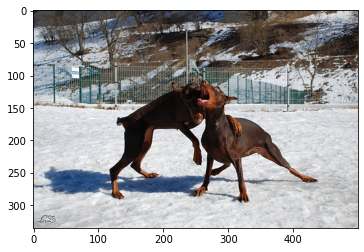

['dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog']


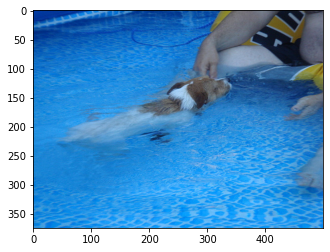

['in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in', 'in']


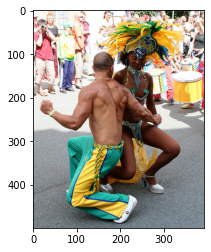

[]


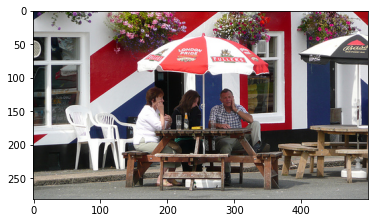

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


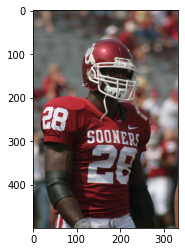

[]


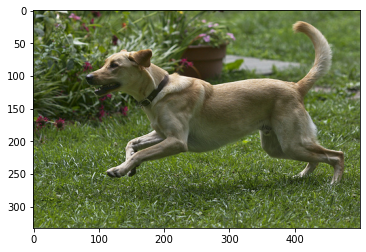

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


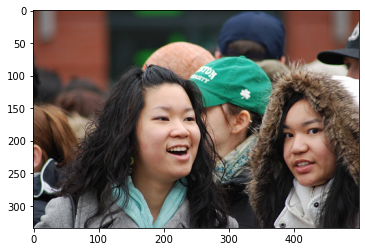

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


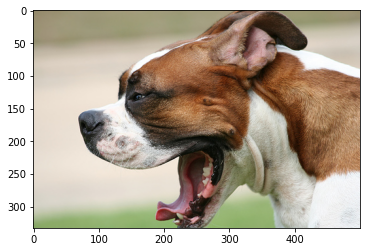

[]


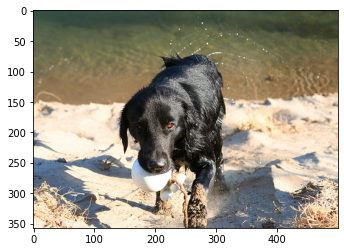

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


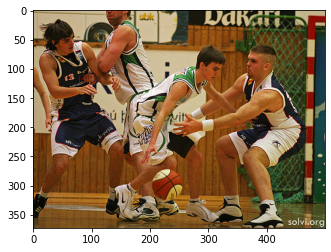

[]


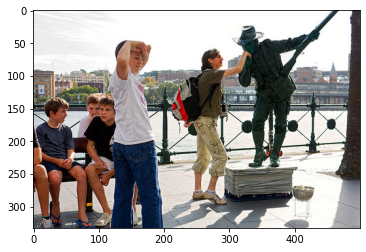

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


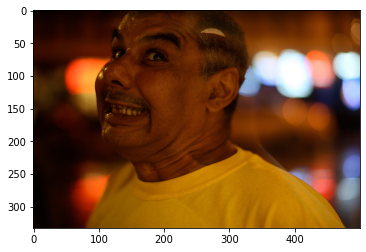

['man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man', 'man']


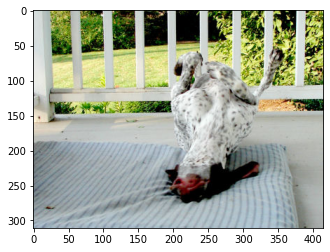

[]


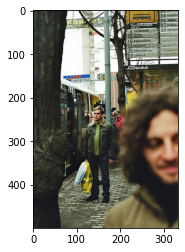

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


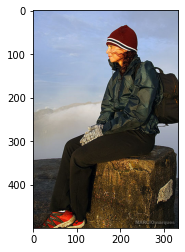

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


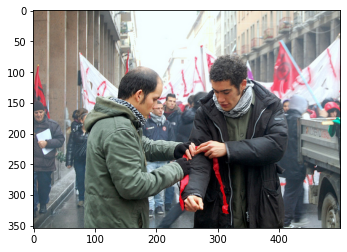

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


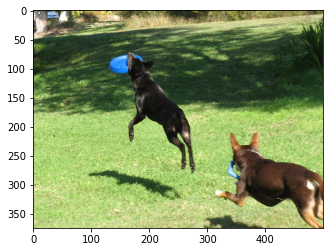

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


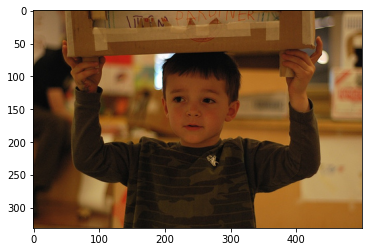

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


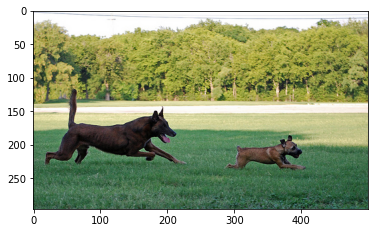

['dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog']


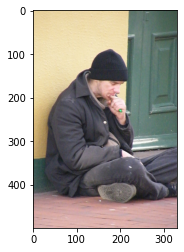

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


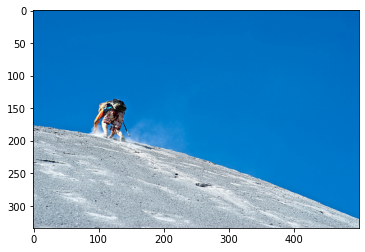

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


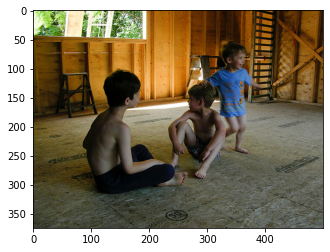

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


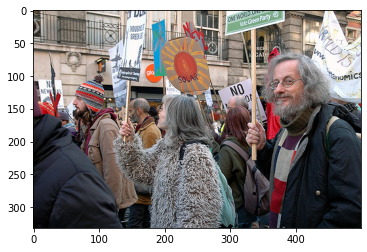

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


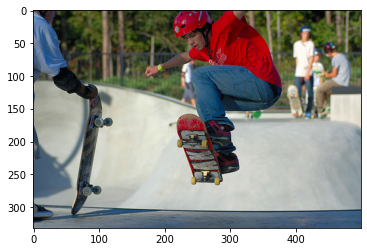

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


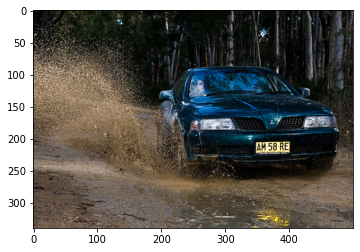

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


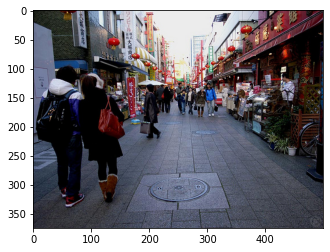

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


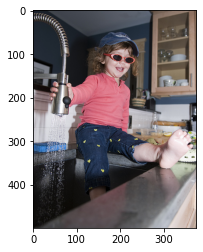

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


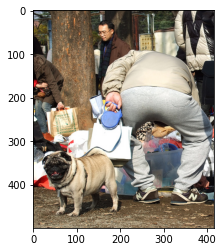

[]


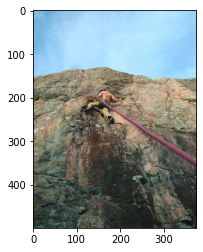

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


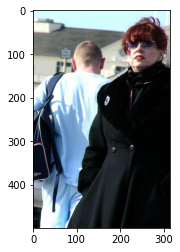

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


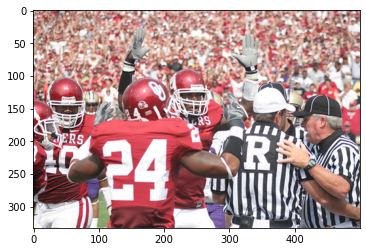

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


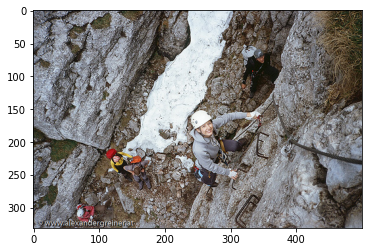

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


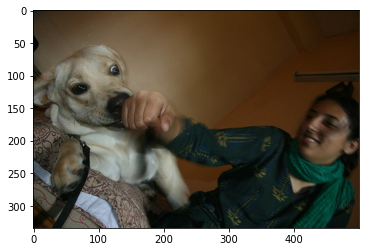

[]


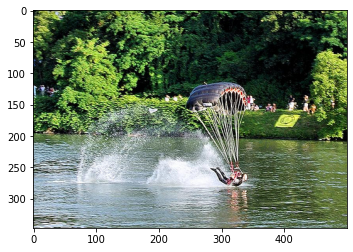

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


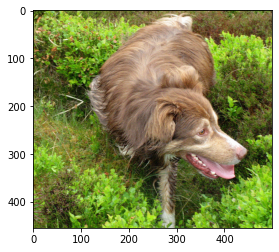

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


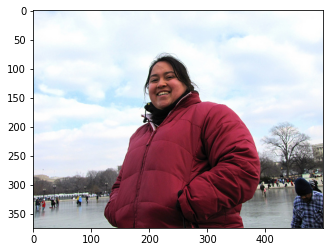

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


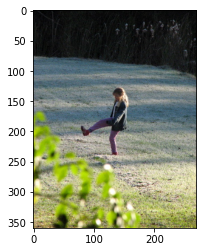

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


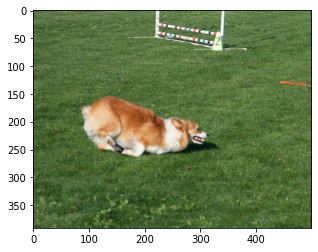

['dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog', 'dog']


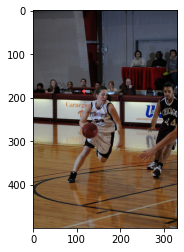

['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


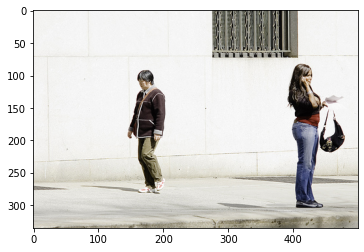

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


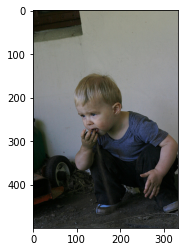

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


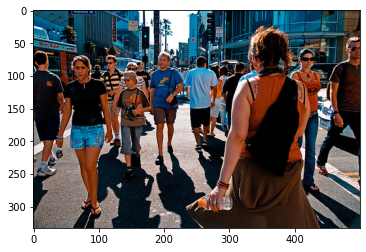

[]


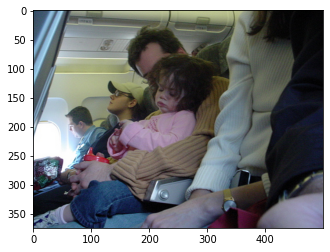

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


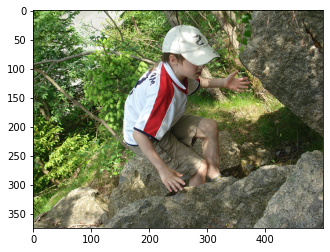

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


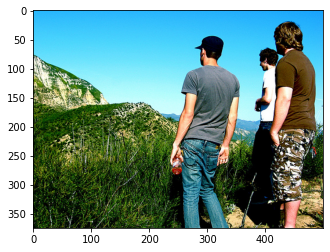

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


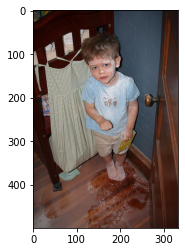

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


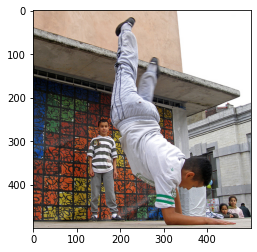

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


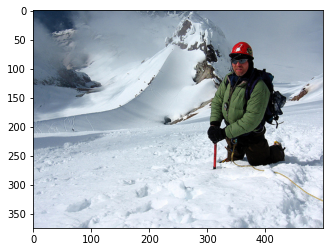

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


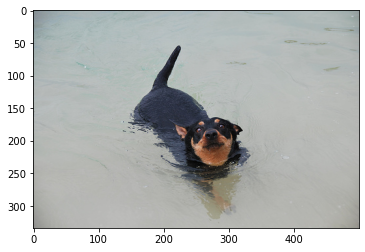

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


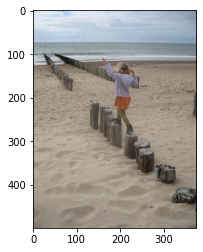

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


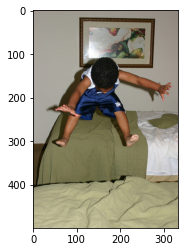

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


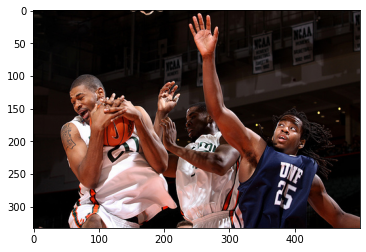

['basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball', 'basketball']


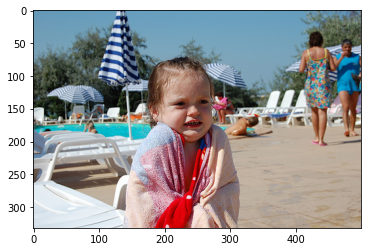

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


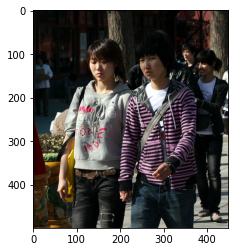

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


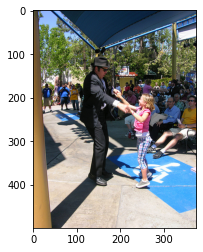

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


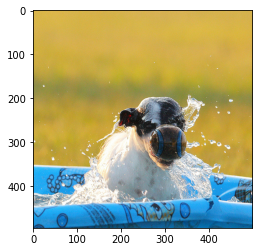

['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


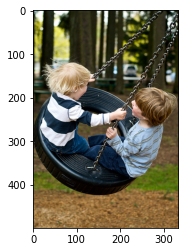

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


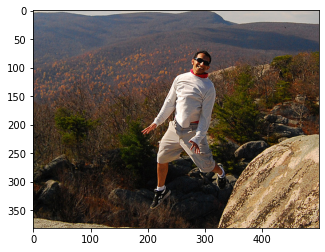

[]


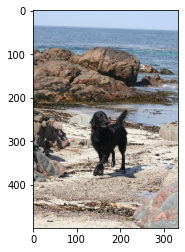

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


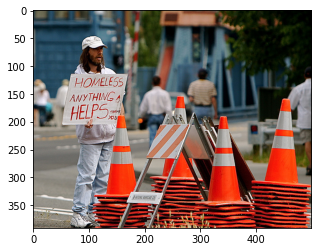

[]


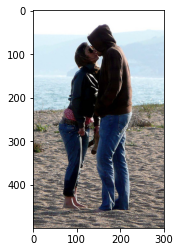

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


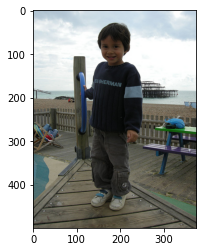

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


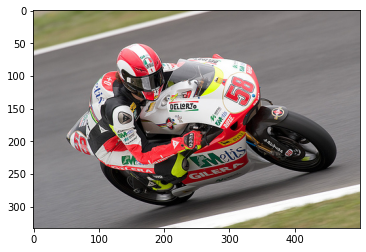

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


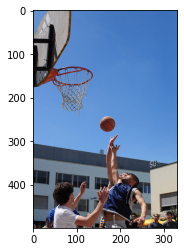

[]


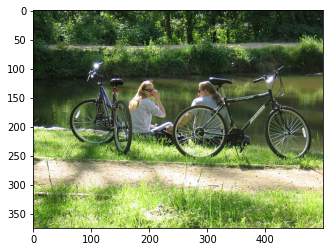

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


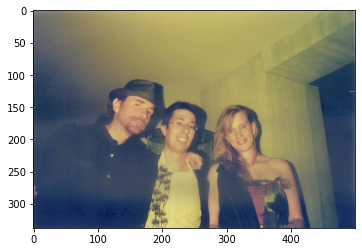

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


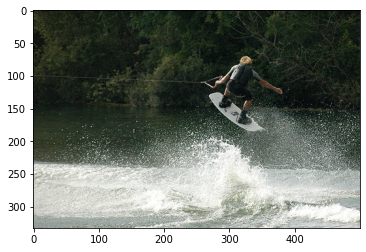

['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


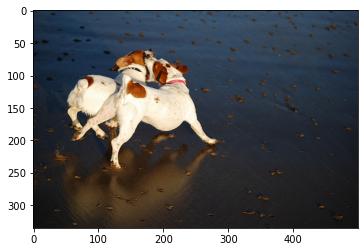

[]


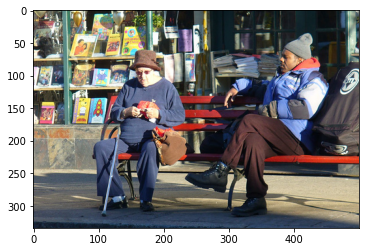

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


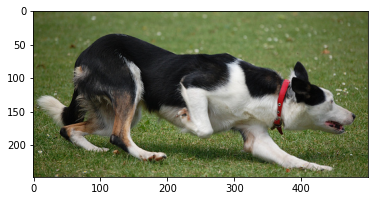

['run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run', 'run']


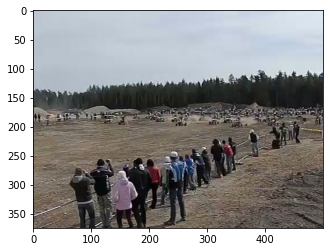

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


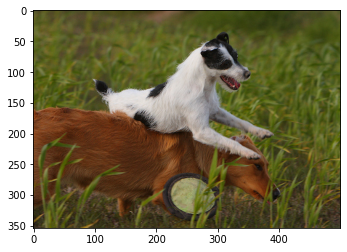

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


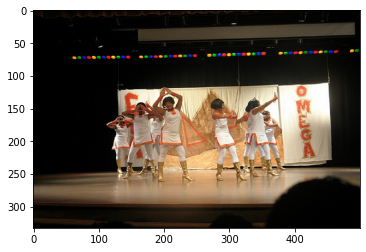

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


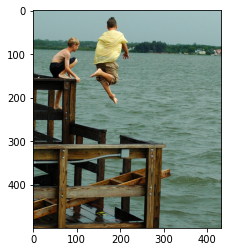

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


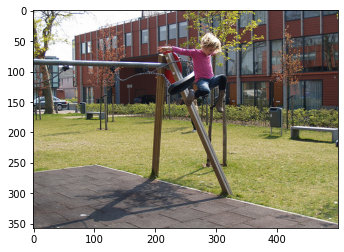

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


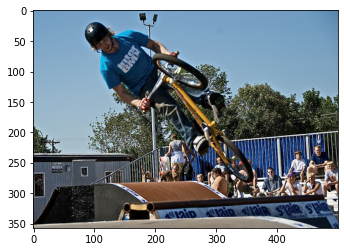

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


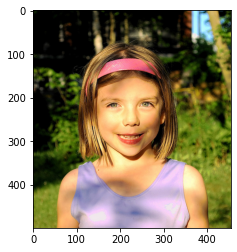

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


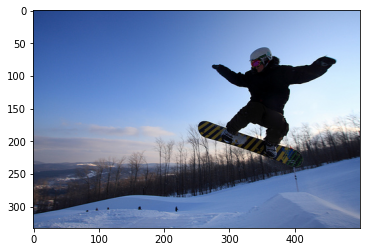

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


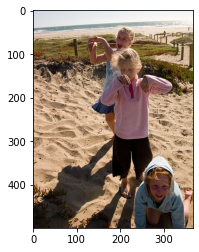

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


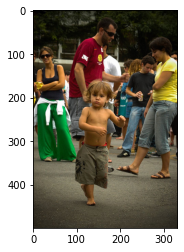

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


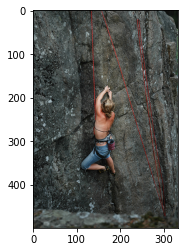

[]


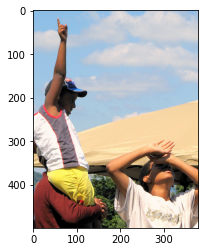

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


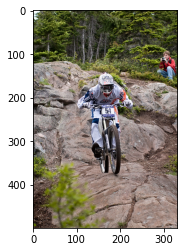

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


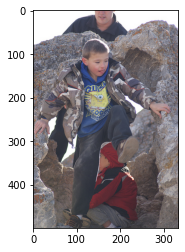

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


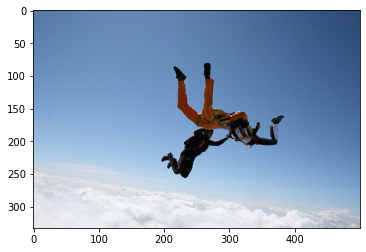

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


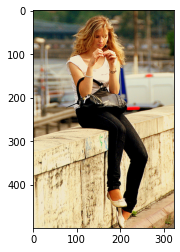

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


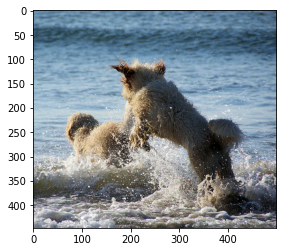

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


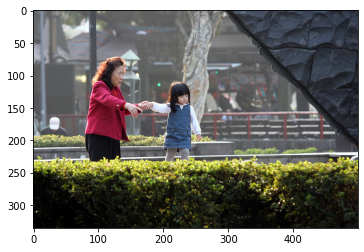

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


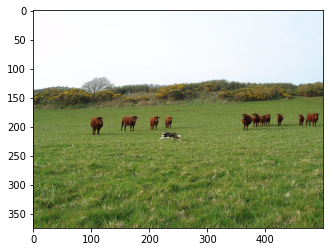

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


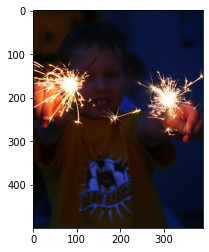

['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


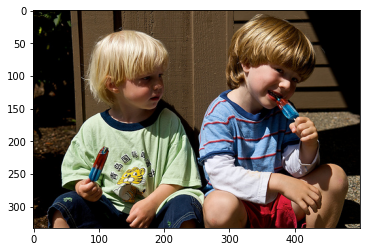

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


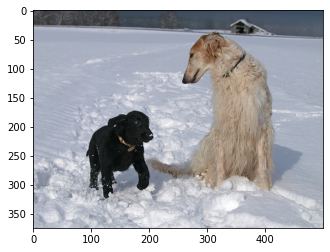

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


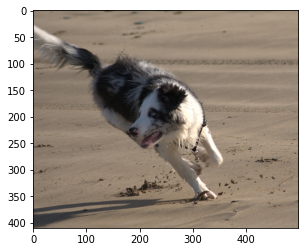

['.', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk', 'Unk']


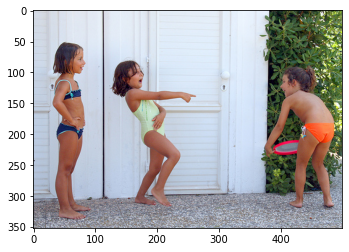

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


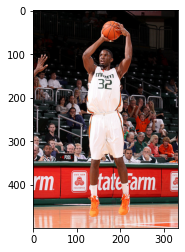

[]


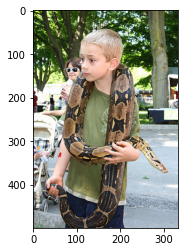

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


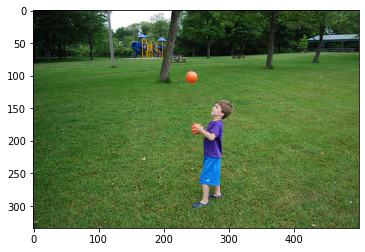

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


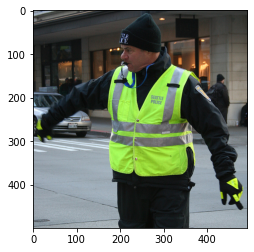

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']


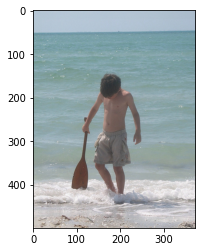

['the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the', 'the']


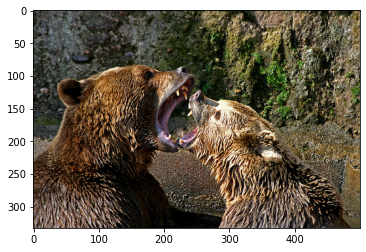

[]


In [94]:
for img_id in list(train_features.keys())[0:100]:
    img=cv2.imread(path+img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));
    photo=train_features[img_id]
    photo1=train_features_background[img_id]
    candidate=greedy_search(photo,photo1)
    plt.show()
    print(candidate)